Set up environment

In [1]:
import os, sys
import pickle
import numpy as np
from scipy import stats
import pandas as pd
import pingouin as pg
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns


from modules.clustering import *
from modules.munging import *
from modules.visualization import *
from modules.autoencoders import *

sns_styleset()

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)
/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/tslearn/clustering/kmeans.py:22: UserWarning: Scikit-learn <0.24 will be deprecated in a future release of tslearn
  warnings.warn(


Load data

In [2]:
preprocessed = True
if preprocessed:
    data_path = os.path.join('data', 'df_100_100.csv')
    df = pd.read_csv(data_path)

Set path for figures

In [3]:
fig_dir = os.path.join('figures', 'appendix')

Specify "training" window

In [4]:
n_matches = 100
start_gap = 1
end_gap = 5

## Verify main clustering results with additional techniques

--------

### HDBSCAN

In [5]:
df = df.sort_values(['account_id', 'nth_match', 'date'])

In [6]:
embedding_path = os.path.join('results', 'arrays', 'embedding_feat.npy')
viz_path = os.path.join('results', 'arrays', 'embedding_viz.npy')

if os.path.isfile(embedding_path) and os.path.isfile(viz_path):
    features_embedding = np.load(embedding_path)
    viz_embedding = np.load(viz_path)
else:
    # Save embedding structure
    for n_components, name in zip([2, 20], ['viz', 'feat']):
        file_path = os.path.join('results', 'arrays', f'embedding_{name}')
        embedding = UMAP(
            n_components=n_components,
            n_neighbors=100,
            verbose=True,
            n_epochs=1000,
            metric='euclidean'
        ).fit_transform(X.reshape(X.shape[0], X.shape[1]))

        np.save(file_path, embedding)

In [7]:
hdb_clust = HDBSCAN(
    min_cluster_size=4000, 
    min_samples=200
)
hdb_clust.fit(features_embedding)

df['hdbscan_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), hdb_clust.labels_)}
)

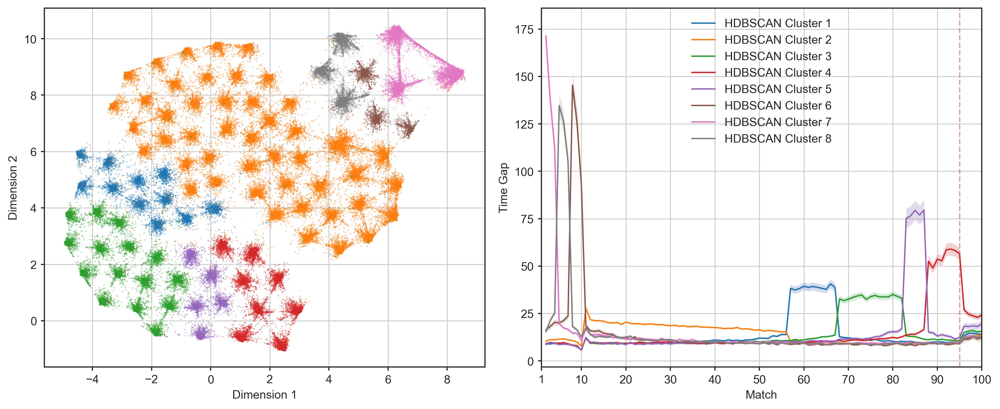

In [47]:
profiles_visualizer(
    df=df, 
    grouper='hdbscan_clusters',
    grouper_rmp={'hdbscan_clusters': 'HDBSCAN Cluster'},
    dim_reduction=viz_embedding, 
    target='time_gap', 
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'HDBSCAN_clusters_matches_{start_gap}-{100-end_gap}_spacing_profiles',
    target_rmp={'time_gap': 'Time Gap'},
    cmap='tab10',
    legend=True
)

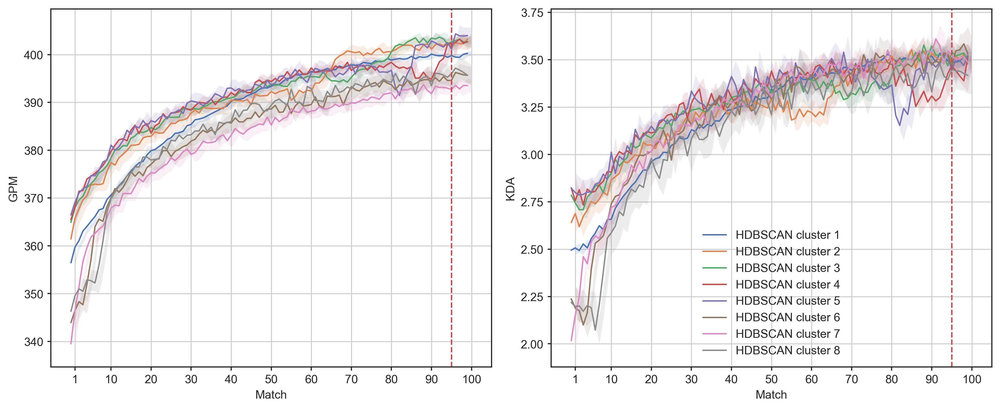

In [45]:
TARGETS = [
    'gpm',
    'kda'
]

target_rmp = {
    'gpm': 'GPM',
    'kda': 'KDA'
}

curves_visualizer(
    df=df[df['hdbscan_clusters'] != -1],
    grouper='hdbscan_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'gpm_kda_trajectories_of_HDBSCAN_clusters_matches_{start_gap}-{100-end_gap}',
    target_rmp=target_rmp,
    grouper_rmp={'hdbscan_clusters': 'HDBSCAN cluster'},
    accounts_to_retain=None #add dictionary of accounts to retain if you want to filter out the others
)

In [19]:
data = create_summary_dataframe(
    df=df,
    dvs=['gpm', 'kda'],
    n_matches=100,
    head=5,
    tail=5,
    spacing='time_delta',
    verbose=True)

,account_id,spacing,gpm_initial_perf,gpm_acquisition,kda_initial_perf,kda_acquisition
0,5296,26.77801,346.11977,99.80257,2.65015,-0.81076
1,8520,27.30183,316.06484,-19.24054,1.41944,-0.50000
2,9855,81.54716,453.01974,27.62239,1.27538,1.38410
3,26850,22.10049,373.06005,22.67825,2.30371,2.27629
4,28324,27.36384,539.72026,-45.24497,3.46929,1.14786


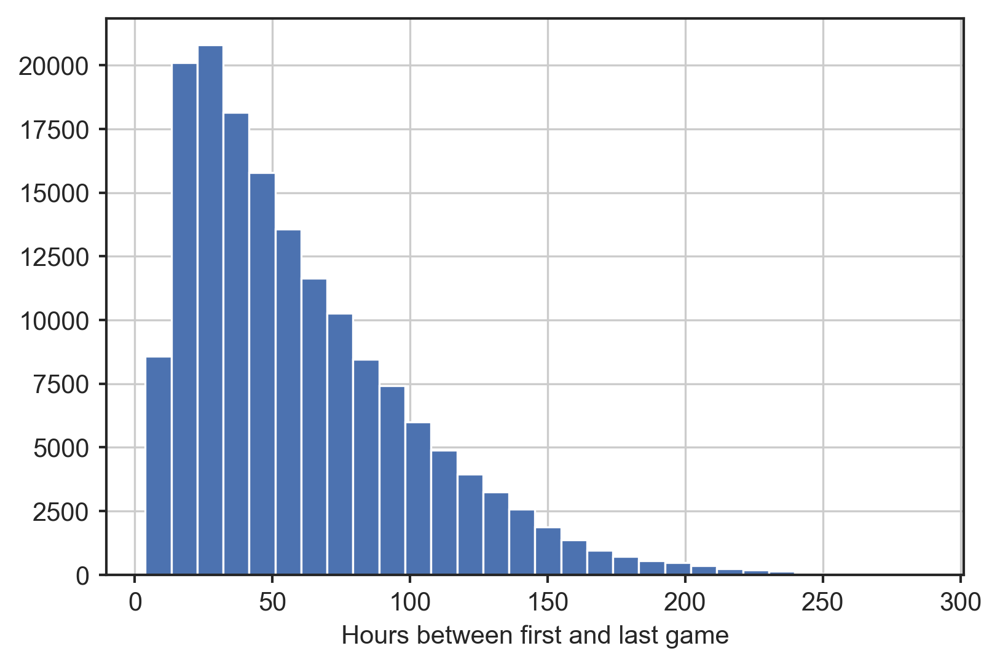

In [23]:
data['spacing'].hist(bins=30)
plt.xlabel('Hours between first and last game')

fig_name = f'histogram_hours_between_first_and_last_game'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')
plt.show()

In [24]:
# declare intervals based on head, middle, and tail of histogram above
intervals = [(1, 15), (76, 90), (136, 150)]
# split summary df and main df into groups based on spacing intervals
groups = [data[(data['spacing'].between(i[0], i[1]))] for i in intervals]
groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in groups]
# get number of players in each group
[group['account_id'].nunique() for group in groups]

[11963, 13120, 3545]

In [25]:
print(data['gpm_initial_perf'].describe())
print(data['kda_initial_perf'].describe())

count   162417.00000
mean       362.26152
std         63.72333
min        195.16990
25%        315.38942
50%        350.85369
75%        399.88591
max        734.25728
Name: gpm_initial_perf, dtype: float64
count   162417.00000
mean         2.54909
std          1.99814
min          0.06136
25%          1.18331
50%          1.94048
75%          3.26273
max         21.80000
Name: kda_initial_perf, dtype: float64


Subsample players with similar initial performance

In [26]:
gpm_subsample = data[data['gpm_initial_perf'].between(325, 375)]  # median initial_perf +- 25
print(f'There are {len(gpm_subsample)} players in the subsample matched on median initial GPM performance')
kda_subsample = data[data['kda_initial_perf'].between(1.74, 2.13)]  # median initial_perf +- 0.19
print(f'There are {len(kda_subsample)} players in the subsample matched on median initial KDA performance')

There are 52440 players in the subsample matched on median initial GPM performance
There are 17125 players in the subsample matched on median initial KDA performance


In [27]:
# split summary df and main df into groups based on spacing intervals
gpm_groups = [gpm_subsample[(gpm_subsample['spacing'].between(i[0], i[1]))] for i in intervals]
gpm_groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in gpm_groups]
# get number of players in each group
[group['account_id'].nunique() for group in gpm_groups]

[2790, 4510, 1236]

In [28]:
# split summary df and main df into groups based on spacing intervals
kda_groups = [kda_subsample[(kda_subsample['spacing'].between(i[0], i[1]))] for i in intervals]
kda_groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in kda_groups]
# get number of players in each group
[group['account_id'].nunique() for group in kda_groups]

[1159, 1417, 373]

In [29]:
accounts_to_retain={'gpm': pd.concat(gpm_groups_df)['account_id'].unique(),
                    'kda': pd.concat(kda_groups_df)['account_id'].unique()}

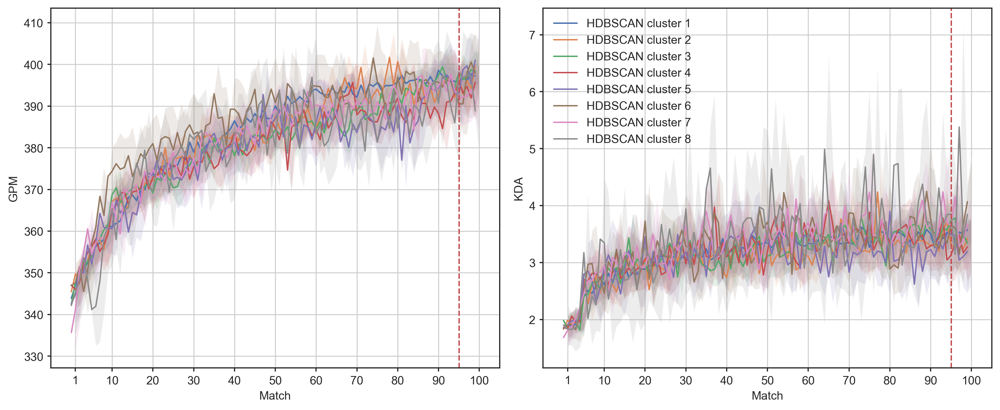

In [46]:
curves_visualizer(
    df=df[df['hdbscan_clusters'] != -1],
    grouper='hdbscan_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'matched_gpm_kda_trajectories_of_HDBSCAN_clusters_matches_{start_gap}-{100-end_gap}',
    target_rmp=target_rmp,
    grouper_rmp={'hdbscan_clusters': 'HDBSCAN cluster'},
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

### K-Means

In [32]:
df = df.sort_values(['account_id', 'nth_match'])
unique_ids = len(df['account_id'].unique())
X = df['time_gap'].values
X = X.reshape((unique_ids, 100))
X = X[:, 1:-5]
X = tsmv().fit_transform(X)

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/sklearn/utils/validation.py:931: FutureWarning: Passing attributes to check_is_fitted is deprecated and will be removed in 0.23. The attributes argument is ignored.
  warnings.warn("Passing attributes to check_is_fitted is deprecated"


Clustering 2
Clustering 3
Clustering 4
Clustering 5
Clustering 6
Clustering 7
Clustering 8
Clustering 9
Optimal K found at 6


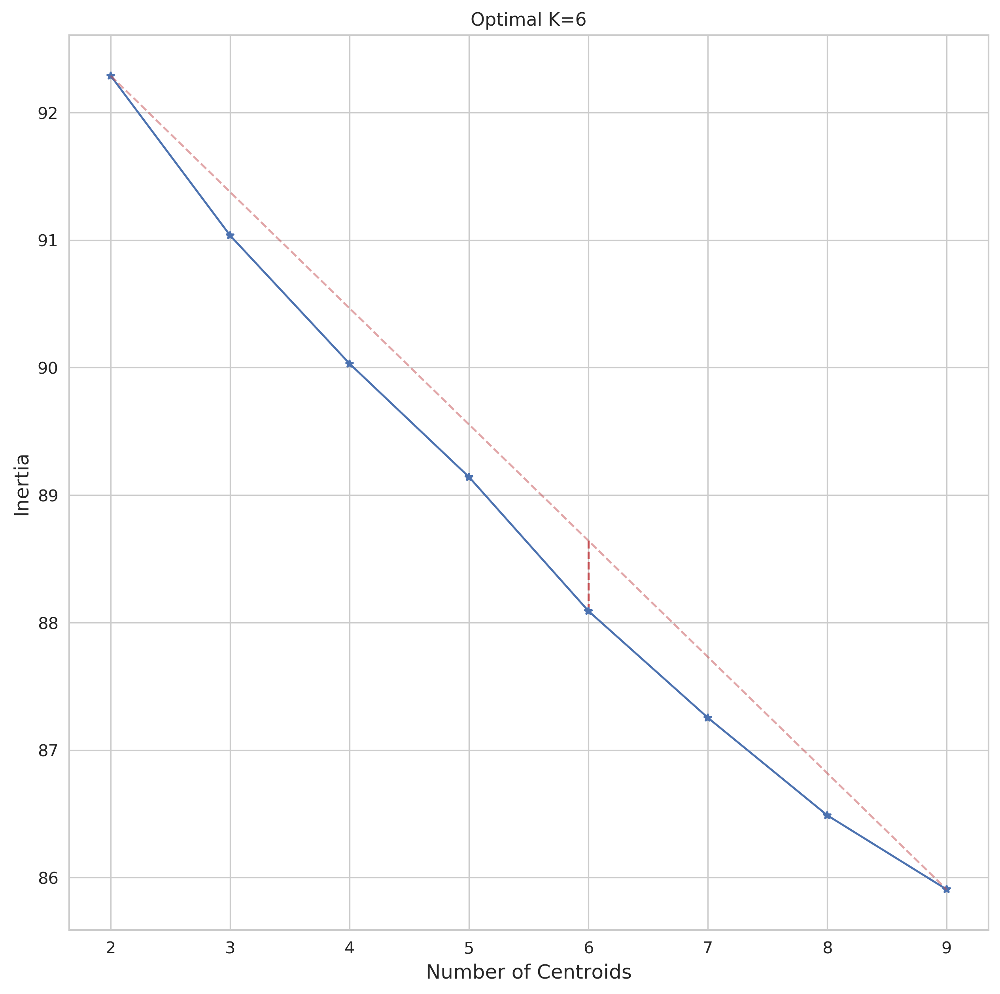

In [49]:
km_clust = auto_k_means(
    X=X, 
    min_k=2, 
    max_k=10, 
    fig_dir=os.path.join('figures', 'appendix'), 
    max_iter=300,
    n_init=1
)
df['km_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), km_clust.labels_)}
)

In [37]:
clusters=6
km_clust = tskm(
    n_clusters=clusters, 
    n_jobs=-1,
    verbose=1,
    n_init=1,
    max_iter=50
)
km_clust.fit(X)

156.794 --> 90.286 --> 89.737 --> 89.342 --> 89.199 --> 89.114 --> 89.040 --> 88.967 --> 88.894 --> 88.833 --> 88.785 --> 88.740 --> 88.690 --> 88.645 --> 88.601 --> 88.541 --> 88.460 --> 88.399 --> 88.373 --> 88.360 --> 88.348 --> 88.337 --> 88.328 --> 88.321 --> 88.317 --> 88.314 --> 88.313 --> 88.312 --> 88.311 --> 88.310 --> 88.309 --> 88.307 --> 88.306 --> 88.305 --> 88.304 --> 88.304 --> 88.303 --> 88.303 --> 88.302 --> 88.302 --> 88.301 --> 88.301 --> 88.300 --> 88.299 --> 88.297 --> 88.296 --> 88.295 --> 88.294 --> 88.293 --> 88.293 --> 


TimeSeriesKMeans(dtw_inertia=False, init='k-means++', max_iter=50,
                 max_iter_barycenter=100, metric='euclidean',
                 metric_params=None, n_clusters=6, n_init=1, n_jobs=-1,
                 random_state=None, tol=1e-06, verbose=1)

In [38]:
df['km_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), km_clust.labels_)}
)

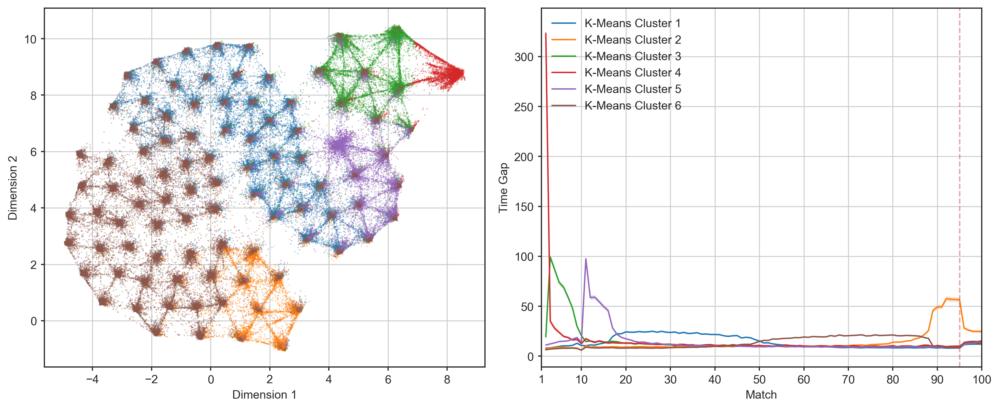

In [48]:
profiles_visualizer(
    df=df, 
    grouper='km_clusters',
    grouper_rmp={'km_clusters': 'K-Means Cluster'},
    dim_reduction=viz_embedding, 
    target='time_gap', 
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'K-Means_clusters_matches_{start_gap}-{100-end_gap}_spacing_profiles',
    target_rmp={'time_gap': 'Time Gap'},
    cmap='tab10',
    legend=True
)

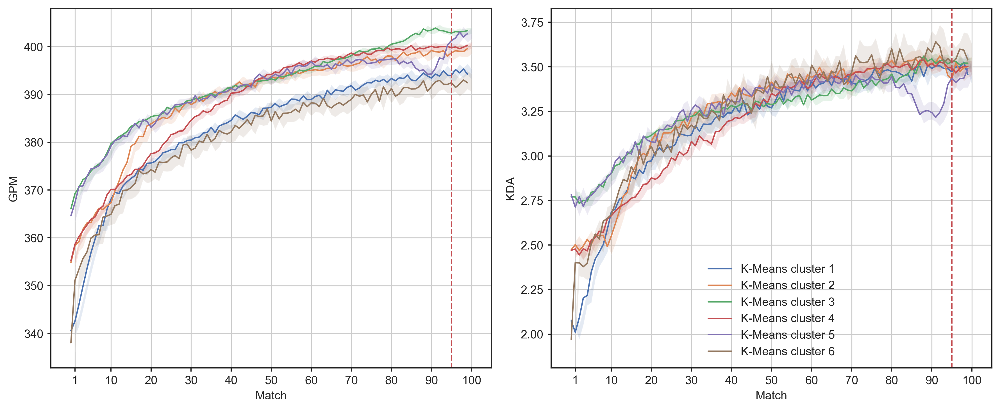

In [41]:
curves_visualizer(
    df=df,
    grouper='km_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'gpm_kda_trajectories_of_K-Means_clusters_matches_{start_gap}-{100-end_gap}',
    target_rmp=target_rmp,
    grouper_rmp={'km_clusters': 'K-Means cluster'},
    accounts_to_retain=None #add dictionary of accounts to retain if you want to filter out the others
)

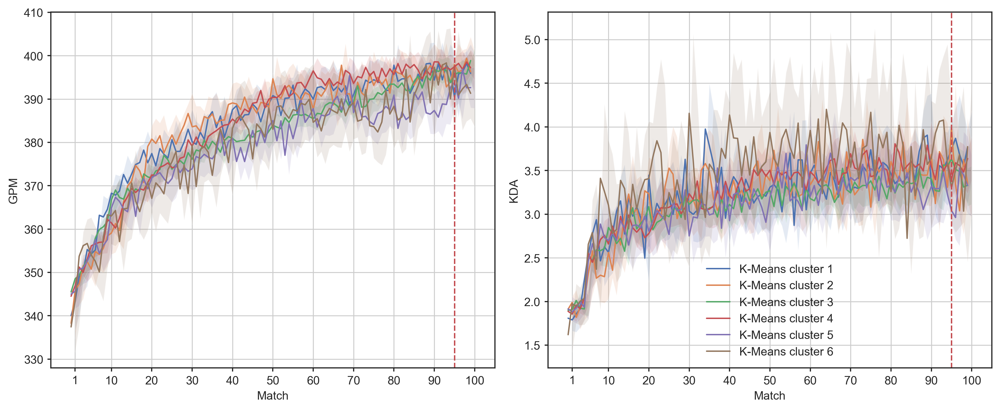

In [44]:
curves_visualizer(
    df=df,
    grouper='km_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'matched_gpm_kda_trajectories_of_K-Means_clusters_matches_{start_gap}-{100-end_gap}',
    target_rmp=target_rmp,
    grouper_rmp={'km_clusters': 'K-Means cluster'},
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)